In [1]:
import argparse
import json
import os
import pickle
import shutil
import subprocess
import sys
from dataclasses import dataclass
from typing import Any, Dict, List, Optional
import matplotlib.pyplot as plt
import cv2
import hydra
import glob
import numpy as np
from PIL import Image
import pandas as pd
import random
from ego4d.internal.colmap.preprocess import download_andor_generate_streams

from ego4d.internal.human_pose.bbox_detector import DetectorModel
from ego4d.internal.human_pose.camera import (
    batch_xworld_to_yimage,
    create_camera,
    create_camera_data,
    get_aria_camera_models,
)
from ego4d.internal.human_pose.config import Config
from ego4d.internal.human_pose.dataset import (
    get_synced_timesync_df,
    SyncedEgoExoCaptureDset,
)
from ego4d.internal.human_pose.pose_estimator import PoseModel
from ego4d.internal.human_pose.readers import read_frame_idx_set
from ego4d.internal.human_pose.triangulator import Triangulator
from ego4d.internal.human_pose.utils import (
    check_and_convert_bbox,
    draw_bbox_xyxy,
    draw_points_2d,
    get_exo_camera_plane,
    get_region_proposal,
    get_bbox_from_kpts,
    aria_extracted_to_original,
    aria_original_to_extracted
)

from iopath.common.file_io import PathManager
from iopath.common.s3 import S3PathHandler
from tqdm.auto import tqdm

from mmdet.apis import inference_detector, init_detector

pathmgr = PathManager()
pathmgr.register_handler(S3PathHandler(profile="default"))
%matplotlib inline

/home/jinxu/miniconda3/envs/human_pose/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/jinxu/code/Ego4d/ego4d/internal/colmap/preprocess.py:612: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  @hydra.main(config_path="configs", config_name=None)


apex is not installed
apex is not installed
apex is not installed


#### Demo: Human Bbox detection with Meta's pipeline

In [6]:
########### Parameter ###########
test_case = 'sfu_cooking_007_3'
exo_cam_names = ['cam01','cam02','cam04', 'cam05']
human_height = 0.7
#################################

dset = SyncedEgoExoCaptureDset(
    data_dir="/media/jinxu/New Volume/ego4dData",
    dataset_json_path=f"/media/jinxu/New Volume/ego4dData/cache/{test_case}/data.json",
    read_frames=False,
)

detector_config = "external/mmlab/mmpose/demo/mmdetection_cfg/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco.py"
detector_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco_20210524_124528-26c63de6.pth'
# body_detector = init_detector(detector_config, 
#                             detector_checkpoint, 
#                             device='cuda:0')
detector_model = DetectorModel(
        detector_config=detector_config,
        detector_checkpoint=detector_checkpoint,
    )

# Create camera
exo_cameras = {
        exo_camera_name: create_camera(
            dset[0][f"{exo_camera_name}_0"]["camera_data"], None
        )
        for exo_camera_name in exo_cam_names
}
exo_camera_centers = np.array(
    [exo_camera.center for exo_camera_name, exo_camera in exo_cameras.items()]
)
_, camera_plane_unit_normal = get_exo_camera_plane(exo_camera_centers)

load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco_20210524_124528-26c63de6.pth


  0%|          | 0/1 [00:00<?, ?it/s]/home/jinxu/code/Ego4d/ego4d/internal/human_pose/external/mmlab/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(
100%|██████████| 1/1 [00:03<00:00,  3.10s/it]


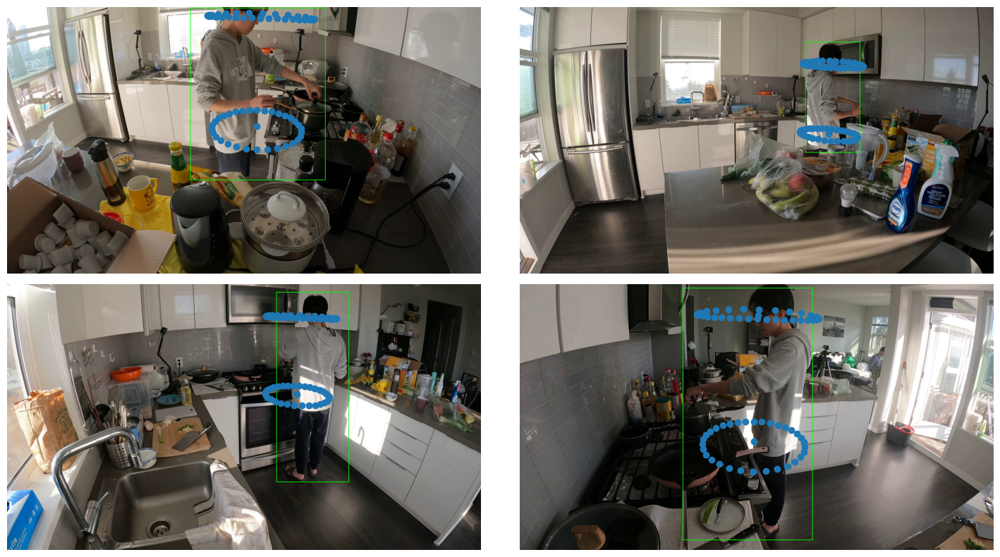

In [9]:
for time_stamp in tqdm([0]):
    info = dset[time_stamp]
    fig,axes=plt.subplots(2,2,figsize=(15,8))
    for idx, exo_camera_name in enumerate(exo_cam_names):
            image_path = info[f"{exo_camera_name}_0"]["abs_frame_path"]
            image = cv2.imread(image_path)

            exo_camera = create_camera(info[f"{exo_camera_name}_0"]["camera_data"], None)
            left_camera = create_camera(
                info["aria01_slam-left"]["camera_data"], None
            )  # TODO: use the camera model of the aria camera
            right_camera = create_camera(
                info["aria01_slam-right"]["camera_data"], None
            )  # TODO: use the camera model of the aria camera
            human_center_3d = (left_camera.center + right_camera.center) / 2

            proposal_points_3d = get_region_proposal(
                human_center_3d,
                unit_normal=-camera_plane_unit_normal,
                human_height=human_height,
            )
            proposal_points_2d = batch_xworld_to_yimage(proposal_points_3d, exo_camera)
            proposal_bbox = check_and_convert_bbox(
                proposal_points_2d,
                exo_camera.camera_model.width,
                exo_camera.camera_model.height,
            )
            # print(exo_camera_name, proposal_bbox)
            bbox_xyxy = None
            offshelf_bboxes = None
            if proposal_bbox is not None:
                proposal_bbox = np.array(
                    [
                        proposal_bbox[0],
                        proposal_bbox[1],
                        proposal_bbox[2],
                        proposal_bbox[3],
                        1,
                    ]
                )  ## add confidnece
                proposal_bboxes = [{"bbox": proposal_bbox}]
                offshelf_bboxes = detector_model.get_bboxes(
                    image_name=image_path, bboxes=proposal_bboxes
                )

            if offshelf_bboxes is not None:
                assert len(offshelf_bboxes) == 1  ## single human per scene
                bbox_xyxy = offshelf_bboxes[0]["bbox"][:4]

                # uncomment to visualize the bounding box
                # bbox_image = draw_points_2d(image, proposal_points_2d, radius=5, color=(0, 255, 0))
                bbox_image = draw_bbox_xyxy(image, bbox_xyxy, color=(0, 255, 0))
            #
            else:
                bbox_image = image 

            # Visualization
            row_idx = idx // 2
            col_idx = idx % 2
            axes[row_idx, col_idx].imshow(bbox_image[:,:,::-1])
            axes[row_idx, col_idx].scatter(proposal_points_2d[:,0], proposal_points_2d[:,1])
            axes[row_idx, col_idx].set_axis_off()
    fig.tight_layout()

#### Demo: Human Body Bbox detection with pretrained detector

In [3]:
########### Parameter ###########
test_case = 'sfu_cooking_007_3'
exo_cam_names = ['cam01','cam02','cam04', 'cam05']
#################################

dset = SyncedEgoExoCaptureDset(
    data_dir="/media/jinxu/New Volume/ego4dData",
    dataset_json_path=f"/media/jinxu/New Volume/ego4dData/cache/{test_case}/data.json",
    read_frames=False,
)

detector_config = "/home/jinxu/code/Ego4d/ego4d/internal/human_pose/external/mmlab/mmpose/demo/mmdetection_cfg/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco.py"
detector_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco_20210524_124528-26c63de6.pth'
body_detector = init_detector(detector_config, 
                            detector_checkpoint, 
                            device='cuda:0')

load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco/faster_rcnn_x101_64x4d_fpn_mstrain_3x_coco_20210524_124528-26c63de6.pth


/home/jinxu/code/Ego4d/ego4d/internal/human_pose/external/mmlab/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


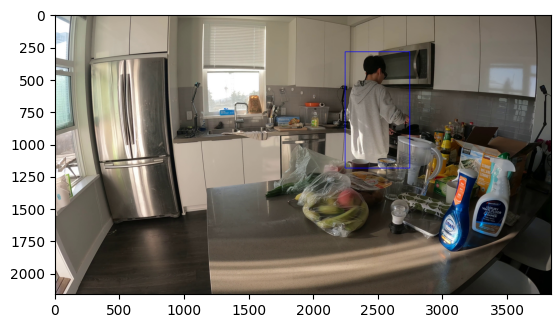

In [6]:
#######################
rand_idx = 22
rand_cam = 'cam02'
#######################


info = dset[rand_idx]
image_path = info[rand_cam]["abs_frame_path"]
det_results = inference_detector(body_detector, image_path)

# Visualization
original_img = cv2.imread(image_path)
for curr_bbox in det_results[0][:1]:
    bbox_img = draw_bbox_xyxy(original_img, curr_bbox[:4])

plt.imshow(bbox_img[:,:,::-1])

In [9]:
det_results[0].flatten()

array([2.2418550e+03, 2.9109131e+02, 2.7413101e+03, 1.1883717e+03,
       9.9844509e-01], dtype=float32)

#### Demo: Wholebody-Hand pose2d visualization

In [13]:
########### Parameter ###########
test_case = 'iu_music'
test_dataset = 'dataset'
#################################

dset = SyncedEgoExoCaptureDset(
    data_dir='/mnt/shared/ego4dData',
    dataset_json_path=f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/data.json',
    read_frames=False,
)

# Hand pose2d model
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(
    hand_pose_config, 
    hand_pose_ckpt, 
    rgb_keypoint_thres=0.3, 
    rgb_keypoint_vis_thres=0.3)

# Body pose2d model
pose_config = "external/mmlab/mmpose/configs/wholebody/2d_kpt_sview_rgb_img/topdown_heatmap/coco-wholebody/hrnet_w48_coco_wholebody_384x288_dark_plus.py"
pose_checkpoint = "https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_wholebody_384x288_dark-f5726563_20200918.pth"
body_pose_model = PoseModel(
    pose_config, 
    pose_checkpoint, 
    rgb_keypoint_thres=0.7, 
    rgb_keypoint_vis_thres=0.7)

# Load body pose2d estimation result
pose2d_file = os.path.join(f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}', 'body/pose2d', 'pose2d.pkl')
assert os.path.exists(pose2d_file), f"{pose2d_file} does not exist"
with open(pose2d_file, "rb") as f:
        poses2d = pickle.load(f)

bbox_dir = os.path.join(f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}', 'body/bbox')
bbox_file = os.path.join(bbox_dir, "bbox.pkl")
with open(bbox_file, "rb") as f:
    bboxes = pickle.load(f)

load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth
load checkpoint from http path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_wholebody_384x288_dark-f5726563_20200918.pth


Left hand:

[0.26114655 0.15533061 0.09188262 0.07562537 0.07316139 0.05038977
 0.05109175 0.05417451 0.04811503 0.05464908 0.06135567 0.04122947
 0.04790269 0.06767995 0.05659253 0.04783551 0.04703733 0.08741019
 0.05034941 0.05437836 0.05091663]

Right hand:

[0.45682883 0.30539468 0.2595432  0.2490238  0.28135824 0.25517946
 0.25379738 0.23582265 0.25580424 0.21684252 0.21116528 0.20536402
 0.21286407 0.16205376 0.16214997 0.16965121 0.20094645 0.13904889
 0.13307323 0.13486715]


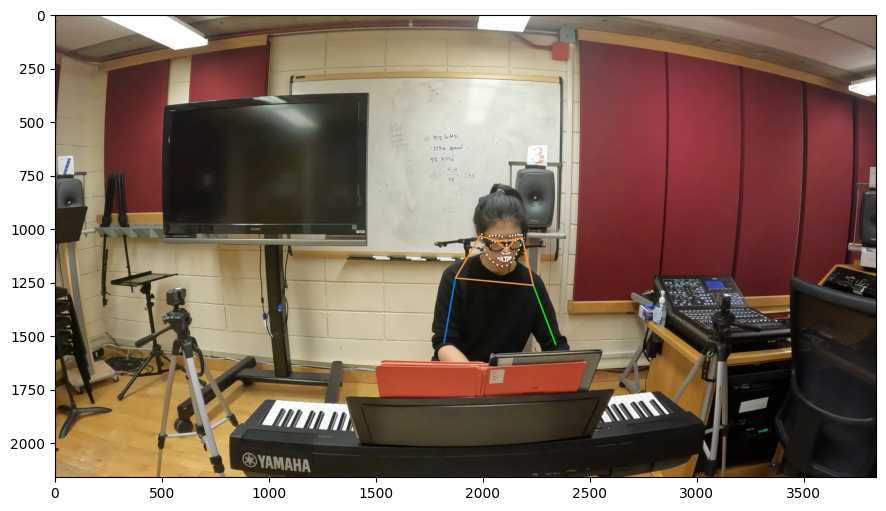

In [14]:
#######################
rand_idx = 1
rand_cam = 'cam01'
#######################
rand_img_path = dset[rand_idx][rand_cam]['abs_frame_path']
rand_img = cv2.imread(rand_img_path)

curr_pose2d = poses2d[rand_idx][rand_cam]
curr_bbox = np.zeros(5) # np.append(bboxes[rand_idx][rand_cam], 1)
pose_results = [{'bbox': curr_bbox,
                 "keypoints":curr_pose2d}]
# Visualization
save_path = 'transfer_test/body_pose2d_vis.jpg'
body_pose_model.draw_poses2d(pose_results, rand_img, save_path)

vis_img = cv2.imread(save_path)
plt.figure(figsize=(12,6))
plt.imshow(vis_img[:,:,::-1])

# Check hand confidence
print('Left hand:\n')
print(curr_pose2d[91:112,2])
print('\nRight hand:\n')
print(curr_pose2d[113:,2])

**Check left/right wholebody-Hand kpts separately for one exo camera**

==================== Summary for cam01 ====================
Bbox conf-mean distance:  10.033516

Right hand kpts confidence:
 [0.60899717 0.45682883 0.30539468 0.2595432  0.2490238  0.28135824
 0.25517946 0.25379738 0.23582265 0.25580424 0.21684252 0.21116528
 0.20536402 0.21286407 0.16205376 0.16214997 0.16965121 0.20094645
 0.13904889 0.13307323 0.13486715]

Left hand kpts confidence:
 [0.26114655 0.15533061 0.09188262 0.07562537 0.07316139 0.05038977
 0.05109175 0.05417451 0.04811503 0.05464908 0.06135567 0.04122947
 0.04790269 0.06767995 0.05659253 0.04783551 0.04703733 0.08741019
 0.05034941 0.05437836 0.05091663]

right_conf_mean:  0.24332269
left_conf_mean:  0.07277402


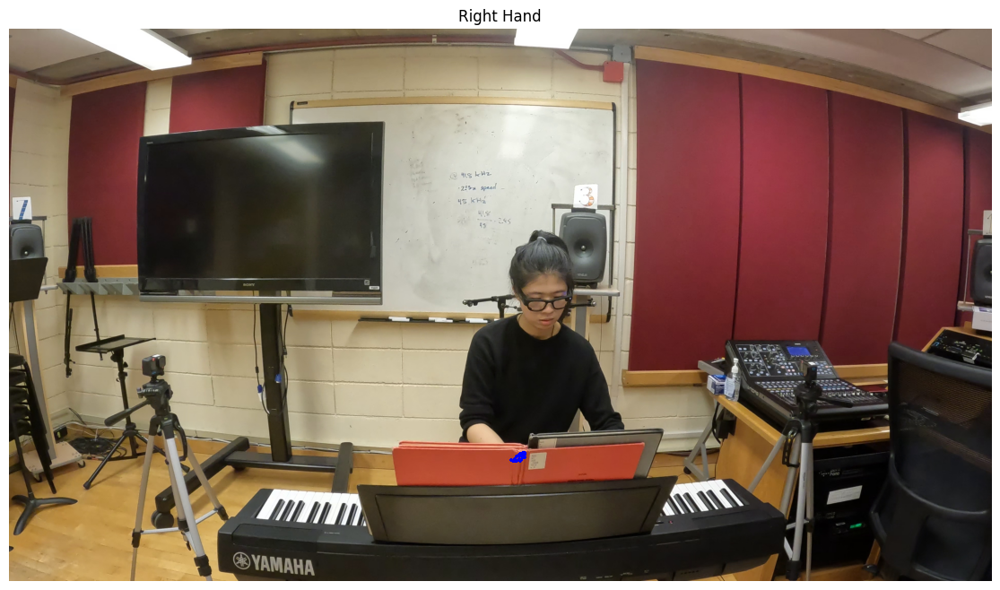

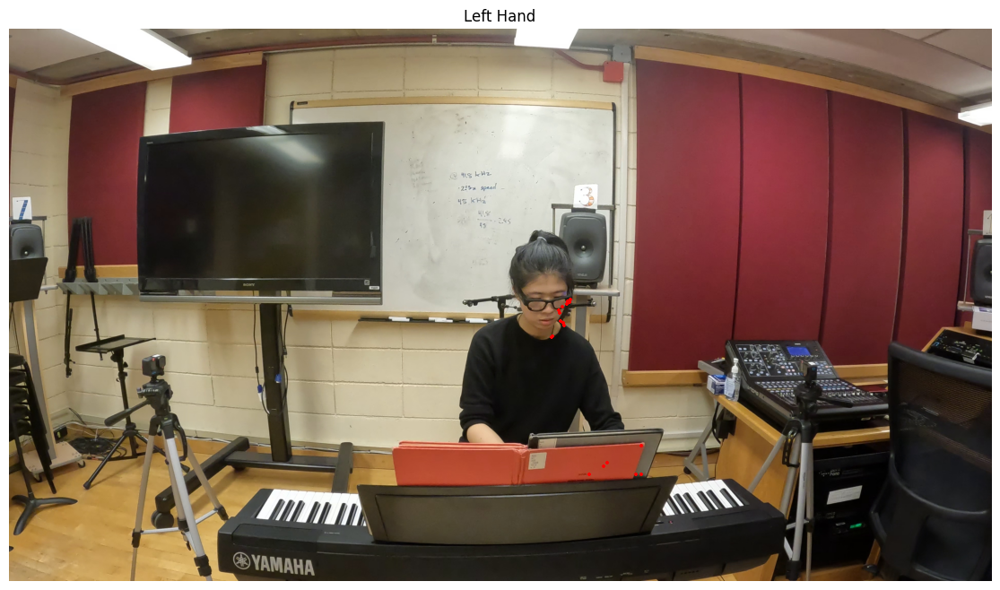

In [20]:
curr_pose2d = poses2d[rand_idx][rand_cam][-42:]

# Right hand visualization
vis_name = "right_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
vis_pose2d_res = {'bbox':np.zeros(5),
                  'keypoints':curr_pose2d[21:]}
# hand_pose_model.draw_poses2d([vis_pose2d_res], vis_twoHand, save_path)
plt.figure(figsize=(16,8))
plt.scatter(curr_pose2d[21:][:,0], curr_pose2d[21:][:,1], marker='+', color='b', s=8)
plt.imshow(vis_twoHand[:,:,::-1])
plt.title('Right Hand')
plt.axis('off')

# Left hand visualization
vis_name = "left_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
vis_pose2d_res = {'bbox':np.zeros(5),
                  'keypoints':curr_pose2d[:21]}
# hand_pose_model.draw_poses2d([vis_pose2d_res], vis_twoHand, save_path)
plt.figure(figsize=(16,8))
plt.scatter(curr_pose2d[:21][:,0], curr_pose2d[:21][:,1], marker='+', color='r', s=8)
plt.imshow(vis_twoHand[:,:,::-1])
plt.title('Left Hand')
plt.axis('off')

# Confidence of each hand kpts
right_hand_pos2d_kpts, left_hand_pos2d_kpts = curr_pose2d[21:], curr_pose2d[:21]
pairwise_conf_dis = np.linalg.norm(left_hand_pos2d_kpts[:,:2] - right_hand_pos2d_kpts[:,:2],axis=1) * \
                                right_hand_pos2d_kpts[:,2] * \
                                left_hand_pos2d_kpts[:,2]
print(f"==================== Summary for {rand_cam} ====================")
print('Bbox conf-mean distance: ',np.mean(pairwise_conf_dis))
print('\nRight hand kpts confidence:\n', right_hand_pos2d_kpts[:,2])
print('\nLeft hand kpts confidence:\n', left_hand_pos2d_kpts[:,2])

right_conf_mean = np.mean(right_hand_pos2d_kpts[:,2])
left_conf_mean = np.mean(left_hand_pos2d_kpts[:,2])
print('\nright_conf_mean: ', right_conf_mean)
print('left_conf_mean: ', left_conf_mean)

(-0.5, 3839.5, 2159.5, -0.5)

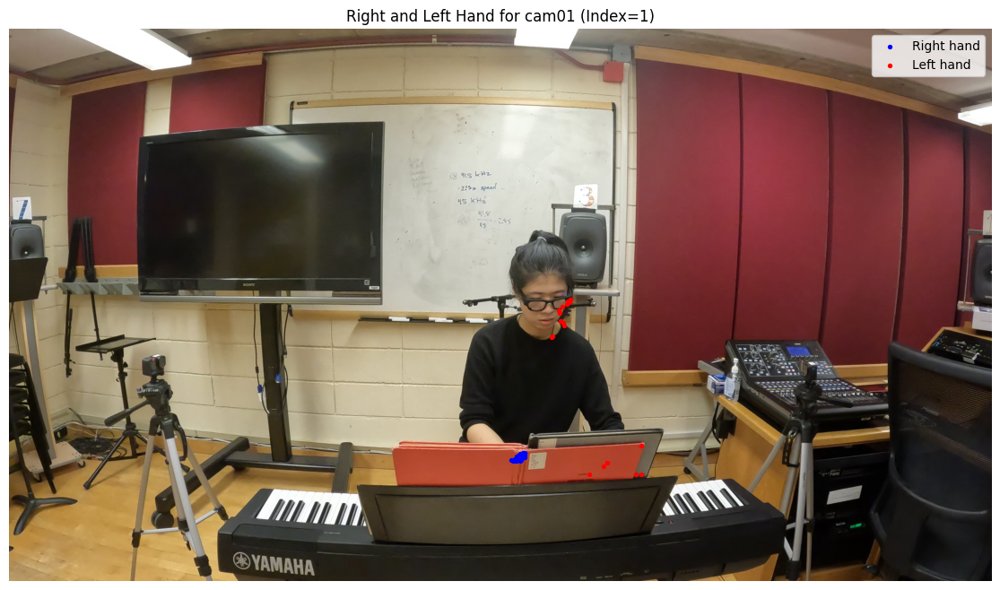

In [23]:
curr_pose2d = poses2d[rand_idx][rand_cam][-42:]

# Right hand visualization
vis_name = "right_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
vis_pose2d_res = {'bbox':np.zeros(5),
                  'keypoints':curr_pose2d[21:]}
# hand_pose_model.draw_poses2d([vis_pose2d_res], vis_twoHand, save_path)
plt.figure(figsize=(16,8))
plt.scatter(curr_pose2d[21:][:,0], curr_pose2d[21:][:,1], color='b', s=8, label='Right hand')
plt.scatter(curr_pose2d[:21][:,0], curr_pose2d[:21][:,1], color='r', s=8, label='Left hand')
plt.imshow(vis_twoHand[:,:,::-1]);
plt.title(f'Right and Left Hand for {rand_cam} (Index={rand_idx})')
plt.legend()
plt.axis('off')

#### Hand pose2d estimation with exo camera

In [58]:
########### Parameter ###########
test_case = 'iu_music'
test_dataset = 'dataset'
exo_cam_names = ['cam01', 'cam02', 'cam03']
#################################

# Load human body keypoints result from mode_pose2d
pose2d_dir = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/body/pose2d'
pose2d_file = os.path.join(pose2d_dir, "pose2d.pkl")
assert os.path.exists(pose2d_file), f"{pose2d_file} does not exist"
with open(pose2d_file, "rb") as f:
    poses2d = pickle.load(f)

#
dset = SyncedEgoExoCaptureDset(
        data_dir='/mnt/shared/ego4dData',
        dataset_json_path=f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/data.json',
        read_frames=False,
    )

# Load in hand pose detector
# hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/onehand10k/res50_onehand10k_256x256.py'
# hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/top_down/resnet/res50_onehand10k_256x256-e67998f6_20200813.pth'
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(hand_pose_config, 
                            hand_pose_ckpt, 
                            rgb_keypoint_thres=0.3, 
                            rgb_keypoint_vis_thres=0.3,
                            refine_bbox=False)

load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth


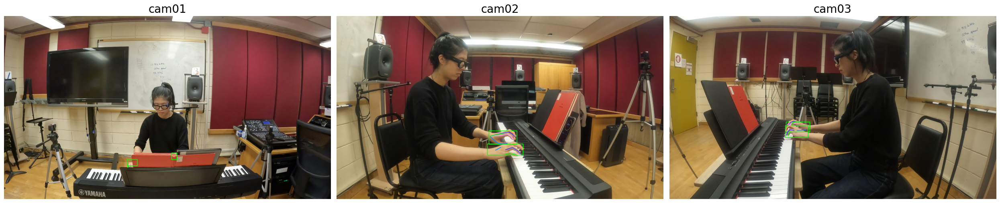

In [59]:
############### Load in image ###############
rand_idx = 437
#############################################

fig,axes=plt.subplots(1,len(exo_cam_names),figsize=(25,15))
vis_exo_pose2d ={}

for idx,rand_cam in enumerate(exo_cam_names):
    # Load in image
    img_path = dset[rand_idx][rand_cam]['abs_frame_path']
    rand_img = np.array(Image.open(img_path))

    ########################## Heuristic Hand bbox ##########################
    # Pose2d keypoints
    body_pose_kpts = poses2d[rand_idx][rand_cam]
    # Extract keypoints for only left hand according to https://github.com/jin-s13/COCO-WholeBody/tree/master#what-is-coco-wholebody
    # Right hand kpts
    right_hand_kpts_index = list(range(112,132))
    right_hand_kpts = body_pose_kpts[right_hand_kpts_index,:]
    # Left hand kpts
    left_hand_kpts_index = list(range(91,111))
    left_hand_kpts = body_pose_kpts[left_hand_kpts_index,:]
    # Heuristic hand bboxes
    img_H, img_W = rand_img.shape[:2]
    right_hand_bbox = get_bbox_fromKpts(right_hand_kpts, img_W, img_H, padding=15)
    left_hand_bbox = get_bbox_fromKpts(left_hand_kpts, img_W, img_H, padding=15)

    ########## Heuristic check: If wholeBody-Hand kpts confidence is too low, then assign zero bbox
    right_kpts_avgConf, left_kpts_avgConf = np.mean(right_hand_kpts[:,2]), np.mean(left_hand_kpts[:,2])
    if right_kpts_avgConf < 0.5:
        right_hand_bbox = np.zeros(4)
    if left_kpts_avgConf < 0.5:
        left_hand_bbox = np.zeros(4)

    # Visualization - bbox with Wholebody-hand kpts for two hands
    # vis_img = rand_img.copy()
    # vis_img = draw_bbox_xyxy(vis_img, right_hand_bbox, color=(255,0,0))
    # vis_img = draw_bbox_xyxy(vis_img, left_hand_bbox, color=(0,0,255))
    # plt.figure(figsize=(12,6))
    # plt.imshow(vis_img)
    # plt.scatter(right_hand_kpts[:,0], right_hand_kpts[:,1], s=3, color='r', label='right_hand_kpts')
    # plt.scatter(left_hand_kpts[:,0], left_hand_kpts[:,1], s=3, color='b', label='left_hand_kpts')
    # plt.legend()

    ########################## Hand pose2d estimation ##########################
    # Append confience score to bbox 
    bbox_xyxy_right = np.append(right_hand_bbox, 1)
    bbox_xyxy_left = np.append(left_hand_bbox, 1)
    two_hand_bboxes=[{"bbox": bbox_xyxy_right},
                    {"bbox": bbox_xyxy_left}]
    # Hand pose estimation
    pose_results = hand_pose_model.get_poses2d(
                        bboxes=two_hand_bboxes,
                        image_name=img_path,
                    )
    vis_exo_pose2d[rand_cam] = pose_results
    # Visualization
    vis_name = f"two_hand_kpts_vis_{rand_cam}.png"
    save_path = f'transfer_test/{vis_name}'
    vis_twoHand = rand_img.copy()
    hand_pose_model.draw_poses2d([pose_results[0]], vis_twoHand[:,:,::-1], save_path)
    vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
    hand_pose_model.draw_poses2d([pose_results[1]], vis_twoHand[:,:,::-1], save_path)
    vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))

    axes[idx].imshow(vis_twoHand)
    axes[idx].set_axis_off()
    axes[idx].set_title(rand_cam,fontsize=20)
fig.tight_layout()

**Check Left/Right hand pose2d estimation separately for one specific exo camera**

==================== Summary for cam03 ====================
Bbox conf-mean distance:  17.872366

Right hand kpts confidence:
 [0.21731058 0.4675954  0.4391784  0.38077027 0.25571266 0.5420677
 0.66695833 0.7125776  0.54287374 0.69785017 0.80877316 0.78929037
 0.7220417  0.597488   0.49702036 0.54625356 0.45256418 0.3591993
 0.42484576 0.30269435 0.30873135]

Left hand kpts confidence:
 [0.1704817  0.16964257 0.11155695 0.11383115 0.45029944 0.22610493
 0.28419173 0.31917185 0.46675846 0.32409012 0.5169618  0.6403242
 0.51155514 0.3910062  0.66987306 0.50663817 0.3760856  0.28430936
 0.7157068  0.73288643 0.5813762 ]

right_conf_mean:  0.51103795
left_conf_mean:  0.40775484


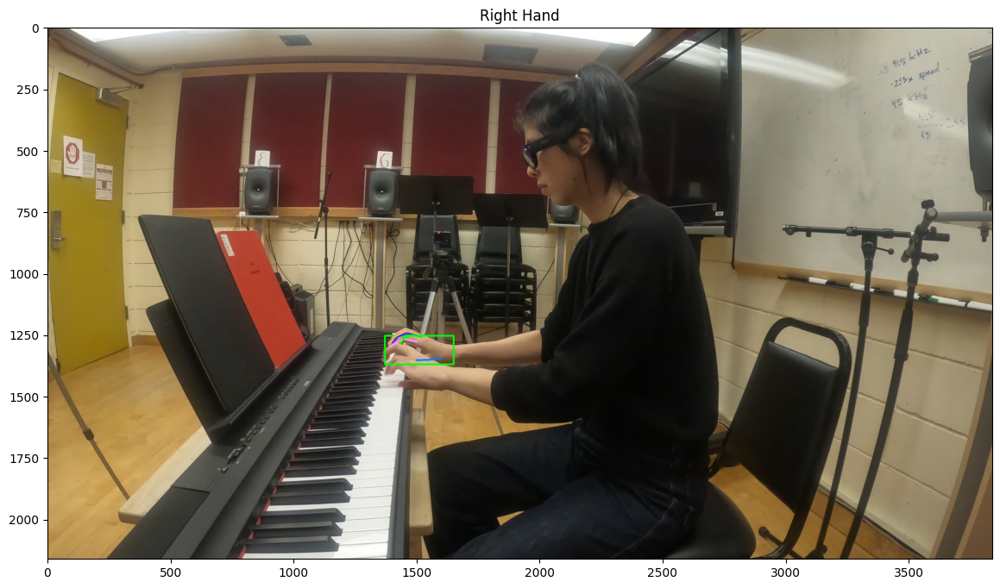

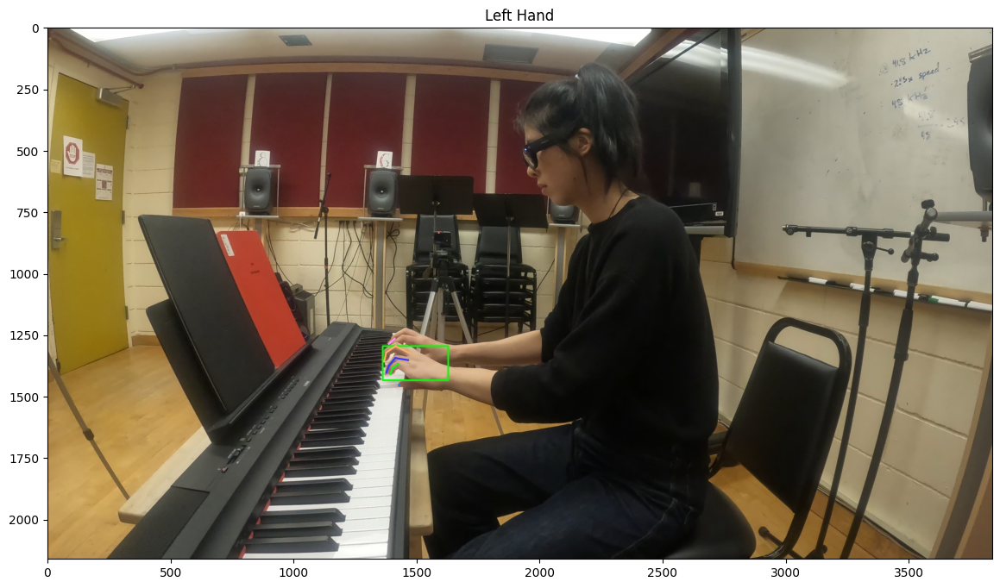

In [60]:
#############################
rand_cam = 'cam03'
#############################

img_path = dset[rand_idx][rand_cam]['abs_frame_path']
rand_img = np.array(Image.open(img_path))

# Right hand visualization
vis_name = "right_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
hand_pose_model.draw_poses2d([vis_exo_pose2d[rand_cam][0]], vis_twoHand[:,:,::-1], save_path)
vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
plt.figure(figsize=(16,8))
plt.imshow(vis_twoHand)
plt.title('Right Hand')

# Left hand visualization
vis_name = "left_hand_kpts_vis.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = rand_img.copy()
hand_pose_model.draw_poses2d([vis_exo_pose2d[rand_cam][1]], vis_twoHand[:,:,::-1], save_path)
vis_twoHand = np.array(Image.open(f'transfer_test/{vis_name}'))
plt.figure(figsize=(16,8))
plt.imshow(vis_twoHand)
plt.title('Left Hand')

# Confidence of each hand kpts
right_hand_pos2d_kpts, left_hand_pos2d_kpts = vis_exo_pose2d[rand_cam][0]['keypoints'], vis_exo_pose2d[rand_cam][1]['keypoints']
pairwise_conf_dis = np.linalg.norm(left_hand_pos2d_kpts[:,:2] - right_hand_pos2d_kpts[:,:2],axis=1) * \
                                right_hand_pos2d_kpts[:,2] * \
                                left_hand_pos2d_kpts[:,2]
print(f"==================== Summary for {rand_cam} ====================")
print('Bbox conf-mean distance: ',np.mean(pairwise_conf_dis))
print('\nRight hand kpts confidence:\n', right_hand_pos2d_kpts[:,2])
print('\nLeft hand kpts confidence:\n', left_hand_pos2d_kpts[:,2])

right_conf_mean = np.mean(right_hand_pos2d_kpts[:,2])
left_conf_mean = np.mean(left_hand_pos2d_kpts[:,2])
print('\nright_conf_mean: ', right_conf_mean)
print('left_conf_mean: ', left_conf_mean)

#### Hand pose2d estimation for Ego camera (aria)

In [45]:
########### Parameter ###########
test_case = 'iu_music'
test_dataset = 'dataset'
#################################

dset = SyncedEgoExoCaptureDset(
        data_dir='/mnt/shared/ego4dData',
        dataset_json_path=f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/data.json',
        read_frames=False,
    )

# Aria rotate save directory
rotImg_output_path = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/frames/aria01/aria_rgb'
os.makedirs(rotImg_output_path, exist_ok=True)

# Load hand bounding box detector
config_file = 'external/mmlab/mmpose/demo/mmdetection_cfg/cascade_rcnn_x101_64x4d_fpn_1class.py'
checkpoint_file = 'https://download.openmmlab.com/mmpose/mmdet_pretrained/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth'
detector = init_detector(config_file, checkpoint_file, device='cuda:0')

# Load hand pose estimation model
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(hand_pose_config, 
                            hand_pose_ckpt, 
                            rgb_keypoint_thres=0.3, 
                            rgb_keypoint_vis_thres=0.3,
                            refine_bbox=False)

load checkpoint from http path: https://download.openmmlab.com/mmpose/mmdet_pretrained/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth
load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth


**1. Rotate aria rgb images**

In [ ]:
# assert len(os.listdir(rotImg_output_path)) == 0, f'Already have files in {rotImg_output_path}'
# for idx in tqdm(range(len(dset))):
#     # Load in and rotate images
#     image_path = dset[idx]['aria_rgb']['abs_frame_path']
#     rot_aria_img = np.array(Image.open(image_path).rotate(270))
#     # Save rotated images following original name convention
#     cv2.imwrite(os.path.join(rotImg_output_path, os.path.basename(image_path)), rot_aria_img[:,:,::-1])

**2. Find hand bounding boxes**

100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

Number of predicted bboxes:  2


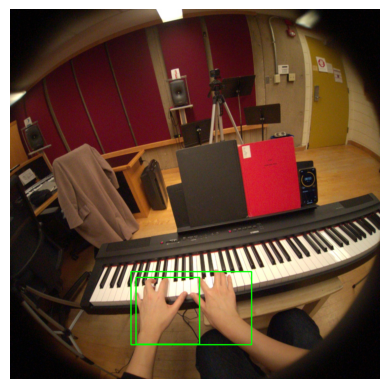

In [81]:
############# Demo: Check bbox result for some random aria images ##############
rotated_aria_img_path = sorted(glob.glob(os.path.join(rotImg_output_path,'*')))

detected_hand_idx = []
for rand_idx in tqdm([56]):
    # rand_img_path = dset[rand_idx]['aria_rgb']['abs_frame_path']
    rand_img_path = rotated_aria_img_path[rand_idx]
    det_results = inference_detector(detector, rand_img_path)
    print('Number of predicted bboxes: ',len(det_results[0]))

    # # Bbox processing
    refined_bbox = det_results[0]
    # refined_bbox = get_two_small_bboxes(refined_bbox)
    # refined_bbox = left_right_bboxes_div(refined_bbox) # (2,4)

    # # Get two bbox with large confidence
    # most_conf_two_bbox = np.argsort(det_results[0][:,-1])[-2:]
    # refined_bbox = det_results[0][most_conf_two_bbox]

    # Visualization
    plt.figure()
    vis_bbox_img = cv2.imread(rand_img_path)
    for curr_hand_bbox in refined_bbox:
        vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_hand_bbox[:4], color=(0,255,0))
    plt.imshow(vis_bbox_img[:,:,::-1])
    plt.axis('off')

In [ ]:
# all_img_dir = glob.glob(rotImg_output_path + '/*')
bbox_output_path = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/bbox'
vis_bbox_path = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/vis_bbox/aria01'
os.makedirs(bbox_output_path, exist_ok=True)
os.makedirs(vis_bbox_path, exist_ok=True)


# Iterate through all aria rotated images
bboxes = {}
for idx in tqdm(range(len(dset))):
    image_path = os.path.join(rotImg_output_path, os.path.basename(dset[idx]['aria_rgb']['abs_frame_path']))
    # Inference 
    det_results = inference_detector(detector, image_path)
    
    if len(det_results[0]) == 0:
        continue

    # Refine detected bboxes to only two bboxes
    refined_two_bboxes = get_two_small_bboxes(det_results[0])
    right_left_bboxes = left_right_bboxes_div(refined_two_bboxes) # (2,4)

    # Visualization
    vis_bbox_img = cv2.imread(image_path)
    color_map = [(255,0,0),(0,255,0)] 
    for ii, curr_hand_bbox in enumerate(right_left_bboxes):
        vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_hand_bbox, color=color_map[ii])
    cv2.imwrite(os.path.join(vis_bbox_path, f'{idx:06d}.jpg'), vis_bbox_img)

    # Save bbox result
    bboxes[idx] = [bbox for bbox in right_left_bboxes] # Follow same convention as mode_hand_pose2d to save hand bbox

# # save the bboxes as a pickle file
# with open(os.path.join(bbox_output_path, "aria_bbox.pkl"), "wb") as f:
#     pickle.dump(bboxes, f)

**3. Hand 2d pose estimation on Aria images**

In [ ]:
# Load in bbox and all image path
# all_img_dir = glob.glob(rotImg_output_path + '/*')
bbox_file = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/bbox/aria_bbox.pkl'
with open(bbox_file, "rb") as f:
    bboxes = pickle.load(f)

# Save directory
pose2d_dir = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/pose2d'
os.makedirs(pose2d_dir, exist_ok=True)
vis_pose2d_dir = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/vis_pose2d/aria01'
os.makedirs(vis_pose2d_dir, exist_ok=True)

poses2d = {}
# Iterate thorugh every aria images 
for idx in tqdm(range(len(dset))):
    image_path = os.path.join(rotImg_output_path, os.path.basename(dset[idx]['aria_rgb']['abs_frame_path']))
    two_hand_bboxes = [{'bbox':np.append(curr_hand_bbox,1)} for curr_hand_bbox in bboxes[idx]]

    # Hand pose estimation
    pose_results = hand_pose_model.get_poses2d(
                        bboxes=two_hand_bboxes,
                        image_name=image_path,
                    )
    
    # Save result
    curr_pose2d_kpts = np.array([res['keypoints'] for res in pose_results])
    poses2d[idx] = curr_pose2d_kpts

    # Visualization
    save_path = f'{vis_pose2d_dir}/{idx:06d}.jpg'
    vis_twoHand = cv2.imread(image_path)
    hand_pose_model.draw_poses2d([pose_results[0]], vis_twoHand, save_path)
    vis_twoHand = cv2.imread(save_path)
    hand_pose_model.draw_poses2d([pose_results[1]], vis_twoHand, save_path)

# save poses2d key points result
with open(os.path.join(pose2d_dir, "aria_pose2d.pkl"), "wb") as f:
    pickle.dump(poses2d, f)

**4. Visualization of aria hand pose 2d estimation**

In [ ]:
############# Left/Right Hand keypoints Check ################
aria_pose2d_file = os.path.join(f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/pose2d', "aria_pose2d.pkl")
with open(aria_pose2d_file, "rb") as f:
    aria_poses2d = pickle.load(f)

###############
rand_idx = 80
###############

image_path = os.path.join(rotImg_output_path, os.path.basename(dset[rand_idx]['aria_rgb']['abs_frame_path']))
rand_img = cv2.imread(image_path)
rand_kpts = aria_poses2d[rand_idx]
plt.figure()
plt.imshow(rand_img[:,:,::-1])
plt.scatter(rand_kpts[0][:,0],rand_kpts[0][:,1], s=5, color='r')
plt.scatter(rand_kpts[1][:,0],rand_kpts[1][:,1], s=5, color='b')

**demo: Hand bbox detection & 2d pose estimation for one aria image**

In [ ]:
##################
rand_idx = 183 # 436
##################
def get_two_small_bboxes(bboxes):
    """
    Since the hand bbox detection might contain multiple results where one bbox capture both hands, while we want each bbox
    to contain only one hand, we select most two small bboxes from multiple results.
    """
    bbox_area = (bboxes[:,2] - bboxes[:,0]) * (bboxes[:,3] - bboxes[:,1])
    min_idx = np.argsort(bbox_area)[:2]
    return bboxes[min_idx,:4]


############ Hand bbox Inference ############
image_path = os.path.join(rotImg_output_path, os.path.basename(dset[rand_idx]['aria_rgb']['abs_frame_path']))
det_results = inference_detector(detector, image_path)
print(f'Raw bbox shape: {det_results[0].shape}')

# Refine detected bboxes to only two bboxes
refined_two_bboxes = get_two_small_bboxes(det_results[0])
right_left_bboxes = left_right_bboxes_div(refined_two_bboxes) # (2,4)
print('Refined two bboxes shape: ',refined_two_bboxes.shape)

# Visualization
vis_bbox_img = cv2.imread(image_path) # BGR if using cv2.imread
# vis_bbox_img = np.array(Image.open(image_path)) # If using this way, then image channel is RGB
color_map = [(255,0,0),(0,255,0)] 
for idx, curr_hand_bbox in enumerate(right_left_bboxes):
    vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, curr_hand_bbox, color=color_map[idx])
plt.figure()
plt.imshow(vis_bbox_img[:,:,::-1])
plt.title('Hand bounding box detection')


############ Hand pose estimation Inference ############
two_hand_bboxes = [{'bbox':np.append(curr_hand_bbox[:4],1)} for curr_hand_bbox in det_results[0][:2]]

# Hand pose estimation
pose_results = hand_pose_model.get_poses2d(
                    bboxes=two_hand_bboxes,
                    image_name=image_path,
                )
# assert len(two_hand_bboxes)==len(pose_results), 'Mis-match between number of bounding boxes and hand pose estimation result'

# Visualization
vis_name = f"aria_pose2d_{os.path.basename(dset[rand_idx]['aria_rgb']['abs_frame_path'])}.png"
save_path = f'transfer_test/{vis_name}'
vis_twoHand = cv2.imread(image_path)
hand_pose_model.draw_poses2d([pose_results[0]], vis_twoHand, save_path)
if len(pose_results) > 1:
    vis_twoHand = cv2.imread(f'transfer_test/{vis_name}')
    hand_pose_model.draw_poses2d([pose_results[1]], vis_twoHand, save_path)
vis_twoHand = cv2.imread(f'transfer_test/{vis_name}')
plt.figure()
plt.imshow(vis_twoHand[:,:,::-1])
plt.title('Hand 2D pose estimation')

**demo: Check pose2d kpts on original images with transformation**

In [ ]:
##################
rand_idx = 183 # 436
##################

# Load original and rotated images
ori_img_path = dset[rand_idx]['aria_rgb']['abs_frame_path']
ori_img = cv2.imread(ori_img_path)
rot_path = os.path.join(rotImg_output_path, os.path.basename(dset[rand_idx]['aria_rgb']['abs_frame_path']))
rot_img = cv2.imread(rot_path)

# Load hand pose2d results on rotated images
aria_pose2d_file = os.path.join(f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/pose2d', "aria_pose2d.pkl")
assert os.path.exists(aria_pose2d_file), f"{aria_pose2d_file} does not exist"
with open(aria_pose2d_file, "rb") as f:
    aria_poses2d = pickle.load(f)


# Visualization
rand_hand_kpts = aria_poses2d[rand_idx]
fig,axes = plt.subplots(1,2,figsize=(18,9))

# Rotated image
axes[0].imshow(rot_img[:,:,::-1])
axes[0].scatter(rand_hand_kpts[0][:,0],rand_hand_kpts[0][:,1],s=5, color='r', label='rihgt_hand')
axes[0].scatter(rand_hand_kpts[1][:,0],rand_hand_kpts[1][:,1],s=5, color='b', label='left_hand')
# Place text index on each kpt
for hand_kpts_index in range(len(rand_hand_kpts[0])):
    axes[0].text(rand_hand_kpts[0][hand_kpts_index,0],rand_hand_kpts[0][hand_kpts_index,1], hand_kpts_index, fontsize=9)
for hand_kpts_index in range(len(rand_hand_kpts[1])):
    axes[0].text(rand_hand_kpts[1][hand_kpts_index,0],rand_hand_kpts[1][hand_kpts_index,1], hand_kpts_index, fontsize=9)
axes[0].set_title('Rotated image w/ detected hand kpts')
axes[0].legend()

# Original image
axes[1].imshow(ori_img[:,:,::-1])
axes[1].scatter(aria_rotate_kpts(rand_hand_kpts[0])[:,0], aria_rotate_kpts(rand_hand_kpts[0])[:,1],s=5, color='r', label='rihgt_hand')
axes[1].scatter(aria_rotate_kpts(rand_hand_kpts[1])[:,0], aria_rotate_kpts(rand_hand_kpts[1])[:,1],s=5, color='b', label='left_hand')
axes[1].legend()
axes[1].set_title('Original image w/ rotated hand kpts')
fig.tight_layout()

#### Hand pose2d estimation for Ego camera (aria) with Re-projected hand 3D keypoints

In some cases (e.g. iiith_cooking_01), the aria image quality is so bad that even pretrained hand detector fails to extract proper hand bounding boxes. To deal with it, we first get hand 3D world coordinates (with `mode=mode_body_pose3d_onlyHand`). Then, we can reproject those points onto aria image plane and propose hand bbox for pose2d estimation.

In [4]:
########### Parameter ###########
test_case = 'iu_music'
exo_cam_names = ['cam02','cam03']
tri_threshold = 0.5
legacy = True
#################################
dataset_dir = f'/mnt/shared/ego4dData/cache/{test_case}/dataset'

dset = SyncedEgoExoCaptureDset(
        data_dir='/mnt/shared/ego4dData',
        dataset_json_path=f'/mnt/shared/ego4dData/cache/{test_case}/dataset/data.json',
        read_frames=False,
        legacy=legacy
    )

# Hand pose2d model
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(
    hand_pose_config, 
    hand_pose_ckpt, 
    rgb_keypoint_thres=0.3, 
    rgb_keypoint_vis_thres=0.1,
    refine_bbox=False)

# Load 3d wholebody-hand kpts
pose3d_dir = os.path.join(dataset_dir, 'body/pose3d', f'wholebodyHand_pose3d_triThresh={tri_threshold}.pkl')
with open(pose3d_dir, "rb") as f:
    wholebodyHand_pose3d = pickle.load(f)

# Create cameras (exo + aria)
aria_exo_cameras = {
    exo_camera_name: create_camera(dset[0][exo_camera_name]["camera_data"], None)
    for exo_camera_name in exo_cam_names
}

load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth


**1. Re-project 3D wholebody-Hand kpts onto aria image plane**

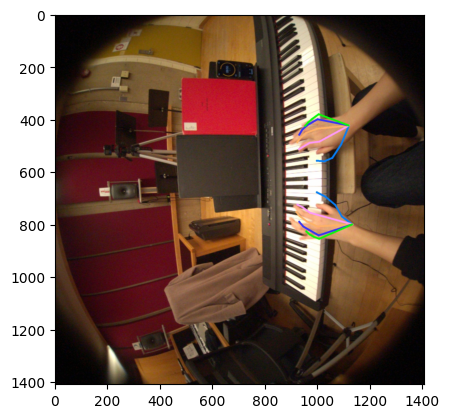

In [5]:
###########################
timestamp = 1
camera_name = 'aria_rgb'
###########################

# Load in aria image
image_path = dset[timestamp][camera_name]["abs_frame_path"]
image = cv2.imread(image_path)

# Create aria camera at current timestamp
aria_exo_cameras[camera_name] = create_camera(dset[timestamp][camera_name]["camera_data"], None)
# Project onto aria image plane
pose3d = wholebodyHand_pose3d[timestamp]
projected_pose3d = batch_xworld_to_yimage(pose3d[:, :3], aria_exo_cameras[camera_name])
projected_pose3d = np.concatenate(
        [projected_pose3d, pose3d[:, 3].reshape(-1, 1)], axis=1
    )

# plt.figure()
# plt.imshow(image[:,:,::-1])
# plt.scatter(projected_pose3d[:21,0],projected_pose3d[:21,1],s=3)

# Visualization
save_path = 'transfer_test/aria_reprojected_wholebodyHand_pose3Dkpts.jpg'
hand_pose_model.draw_projected_poses3d([projected_pose3d[:21], projected_pose3d[21:]], image, save_path)
plt.figure()
plt.imshow(cv2.imread(save_path)[:,:,::-1])

**2. Propose hand bbox based on re-projected kpts**

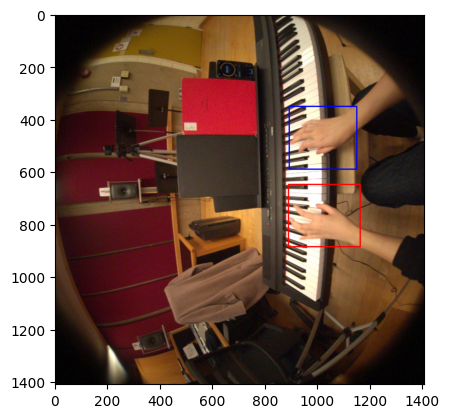

In [5]:
# Propose hand bbox
img_H, img_W = image.shape[:2]
right_hand_kpts, left_hand_kpts = projected_pose3d[21:], projected_pose3d[:21]
right_hand_kpts, left_hand_kpts = right_hand_kpts[right_hand_kpts[:,2]!=0][:,:2], left_hand_kpts[left_hand_kpts[:,2]!=0][:,:2]
right_hand_bbox = get_bbox_fromKpts(right_hand_kpts, img_W, img_H, padding=30)
left_hand_bbox = get_bbox_fromKpts(left_hand_kpts, img_W, img_H, padding=30)

# Visualization
vis_bbox_img = image.copy()
vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, right_hand_bbox, color=(255,0,0))
vis_bbox_img = draw_bbox_xyxy(vis_bbox_img, left_hand_bbox, color=(0,0,255))
plt.imshow(vis_bbox_img[:,:,::-1])

**3. Hand pose2d estimation with proposed hand bbox**

==================== Summary for aria_rgb ====================
Bbox conf-mean distance:  58.51646

Right hand kpts confidence:
 [0.2042495  0.2401892  0.20325655 0.40072376 0.79569924 0.3717705
 0.5787766  0.47052926 0.59939384 0.42839143 0.57281244 0.47890133
 0.6596018  0.41322055 0.60896516 0.28183135 0.24775688 0.22590551
 0.5740192  0.44087008 0.59329665]

Left hand kpts confidence:
 [0.22631422 0.26199293 0.32878134 0.6141812  0.86342657 0.40437773
 0.71558553 0.6948862  0.8466482  0.29927754 0.47663864 0.5387341
 0.5232259  0.14728832 0.32053646 0.22511673 0.13896267 0.08463512
 0.17680398 0.25785652 0.39834303]

right_conf_mean:  0.44715056
left_conf_mean:  0.40683874


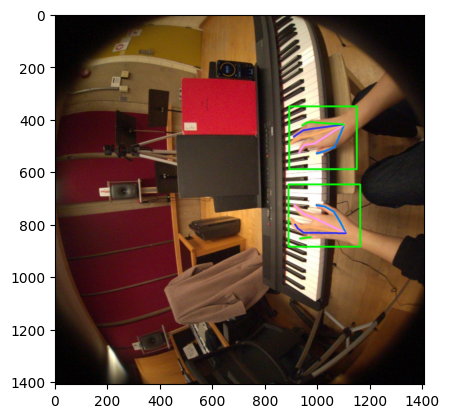

In [7]:
# Append confience score to bbox 
bbox_xyxy_right = np.append(right_hand_bbox, 1)
bbox_xyxy_left = np.append(left_hand_bbox, 1)
two_hand_bboxes=[{"bbox": bbox_xyxy_right},
                {"bbox": bbox_xyxy_left}]
# Hand pose estimation
pose_results = hand_pose_model.get_poses2d(
        bboxes=two_hand_bboxes,
        image_name=image_path,
    )

# Visualization
save_path = 'transfer_test/aria_reprojBbox_handPose2d.jpg'
vis_pose2d_img = image.copy()
hand_pose_model.draw_poses2d([pose_results[0]], vis_pose2d_img, save_path)
vis_pose2d_img = cv2.imread(save_path)
hand_pose_model.draw_poses2d([pose_results[1]], vis_pose2d_img, save_path)
plt.figure()
plt.imshow(cv2.imread(save_path)[:,:,::-1])

# Confidence of each hand kpts
right_hand_pos2d_kpts, left_hand_pos2d_kpts = pose_results[0]['keypoints'], pose_results[1]['keypoints']
pairwise_conf_dis = np.linalg.norm(left_hand_pos2d_kpts[:,:2] - right_hand_pos2d_kpts[:,:2],axis=1) * \
                                right_hand_pos2d_kpts[:,2] * \
                                left_hand_pos2d_kpts[:,2]
print(f"==================== Summary for {camera_name} ====================")
print('Bbox conf-mean distance: ',np.mean(pairwise_conf_dis))
print('\nRight hand kpts confidence:\n', right_hand_pos2d_kpts[:,2])
print('\nLeft hand kpts confidence:\n', left_hand_pos2d_kpts[:,2])

right_conf_mean = np.mean(right_hand_pos2d_kpts[:,2])
left_conf_mean = np.mean(left_hand_pos2d_kpts[:,2])
print('\nright_conf_mean: ', right_conf_mean)
print('left_conf_mean: ', left_conf_mean)

#### Hand pose3d estimation with cam & aria

In [46]:
########### Parameter ###########
test_case = 'iu_music'
test_dataset = 'dataset'
#################################
dataset_dir = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}'

dset = SyncedEgoExoCaptureDset(
        data_dir='/mnt/shared/ego4dData',
        dataset_json_path=f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/data.json',
        read_frames=False,
    )

##### In here we use the pose2d model from mode_hand_pose2d(), which is different from aria hand pose2d estimation model
hand_pose_config = 'external/mmlab/mmpose/configs/hand/2d_kpt_sview_rgb_img/topdown_heatmap/coco_wholebody_hand/hrnetv2_w18_coco_wholebody_hand_256x256_dark.py'
hand_pose_ckpt = 'https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth'
hand_pose_model = PoseModel(
    hand_pose_config, 
    hand_pose_ckpt, 
    rgb_keypoint_thres=0.3, 
    rgb_keypoint_vis_thres=0.3)

# Load hand pose2d keypoints from both cam and aria
cam_pose2d_file = os.path.join(dataset_dir, 'hand/pose2d', "exo_pose2d.pkl")
assert os.path.exists(cam_pose2d_file), f"{cam_pose2d_file} does not exist"
with open(cam_pose2d_file, "rb") as f:
    cam_poses2d = pickle.load(f)

aria_pose2d_file = os.path.join(dataset_dir, 'hand/pose2d', "ego_pose2d.pkl")
assert os.path.exists(aria_pose2d_file), f"{aria_pose2d_file} does not exist"
with open(aria_pose2d_file, "rb") as f:
    aria_poses2d = pickle.load(f)

load checkpoint from http path: https://download.openmmlab.com/mmpose/hand/dark/hrnetv2_w18_coco_wholebody_hand_256x256_dark-a9228c9c_20210908.pth


**demo: Check hand pose2d kpts confidence from aria & exo cameras**

cam01 min conf: 0.0087 	 mean conf: 0.0146
cam02 min conf: 0.2889 	 mean conf: 0.6160
cam03 min conf: 0.1611 	 mean conf: 0.6135
aria min conf: 0.0846 	 mean conf: 0.4270


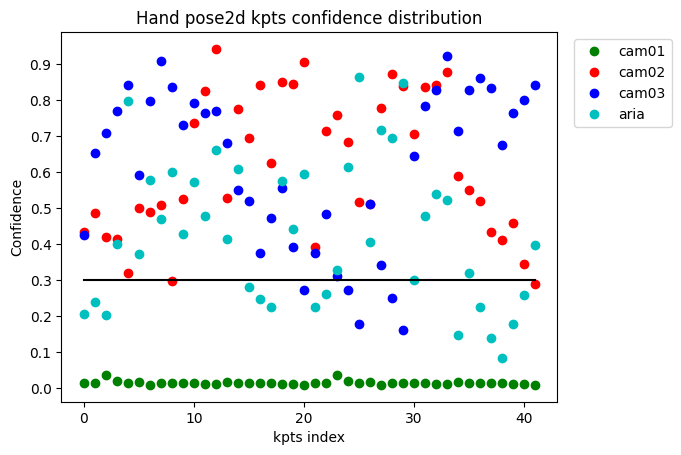

In [49]:
rand_idx = 1

rand_cam_pose2d_kpts = cam_poses2d[rand_idx]
rand_aria_pose2d_kpts = aria_poses2d[rand_idx]

# Check min and mean confidence
for k in rand_cam_pose2d_kpts:
    print(f'{k} min conf: {np.min(rand_cam_pose2d_kpts[k].reshape(-1,3)[:,2]):.4f} \t mean conf: {np.mean(rand_cam_pose2d_kpts[k].reshape(-1,3)[:,2]):.4f}')
print(f'aria min conf: {np.min(rand_aria_pose2d_kpts.reshape(-1,3)[:,2]):.4f} \t mean conf: {np.mean(rand_aria_pose2d_kpts.reshape(-1,3)[:,2]):.4f}')

plt.figure()
plt.plot(rand_cam_pose2d_kpts['cam01'].reshape(-1,3)[:,2], 'go', label='cam01');
plt.plot(rand_cam_pose2d_kpts['cam02'].reshape(-1,3)[:,2], 'ro', label='cam02');
plt.plot(rand_cam_pose2d_kpts['cam03'].reshape(-1,3)[:,2], 'bo', label='cam03');
plt.plot(rand_aria_pose2d_kpts.reshape(-1,3)[:,2], 'co', label='aria');
plt.yticks(np.linspace(0,1,11));
plt.plot([0.3]*len(rand_aria_pose2d_kpts.reshape(-1,3)), 'k')
plt.title('Hand pose2d kpts confidence distribution')
plt.xlabel('kpts index')
plt.ylabel('Confidence')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

Text(0, 0.5, 'Confidence')

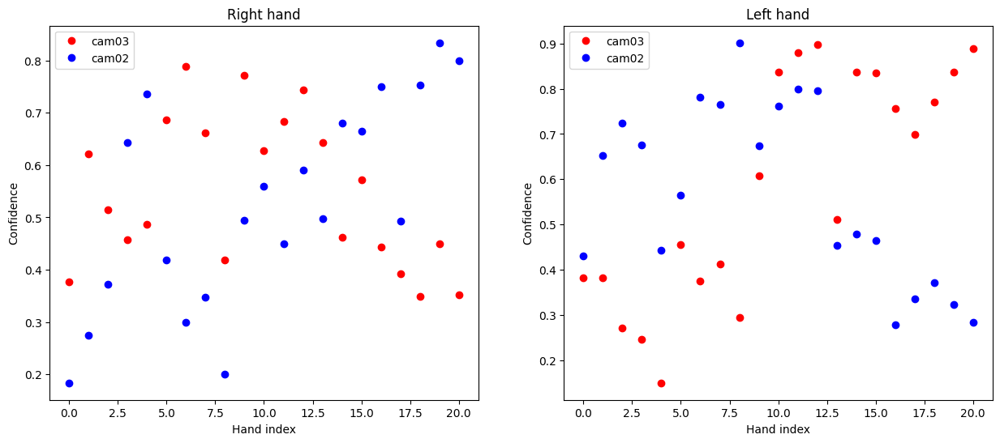

In [59]:
############ Left vs. Right hand exo camera confidence ###########
fig,axes=plt.subplots(1,2,figsize=(15,6))
axes[0].plot(rand_cam_pose2d_kpts['cam03'][0][:,2],'ro', label='cam03')
axes[0].plot(rand_cam_pose2d_kpts['cam02'][0][:,2], 'bo', label='cam02')
axes[0].set_title('Right hand')
axes[0].legend()
axes[0].set_xlabel('Hand index')
axes[0].set_ylabel('Confidence')

axes[1].plot(rand_cam_pose2d_kpts['cam03'][1][:,2],'ro', label='cam03')
axes[1].plot(rand_cam_pose2d_kpts['cam02'][1][:,2], 'bo', label='cam02')
axes[1].set_title('Left hand')
axes[1].legend()
axes[1].set_xlabel('Hand index')
axes[1].set_ylabel('Confidence')

#### Check Aria Triangulation

In [17]:
########### Parameter ###########
test_case = 'iu_music'
test_dataset = 'dataset'
#################################
dataset_dir = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}'

dset = SyncedEgoExoCaptureDset(
        data_dir='/mnt/shared/ego4dData',
        dataset_json_path=f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/data.json',
        read_frames=False,
    )

In [18]:
pose3d_dir = os.path.join(dataset_dir, 'body/pose3d/pose3d.pkl')

with open(pose3d_dir, "rb") as f:
    body_pose3d = pickle.load(f)

body_pose3d[0]

array([[-2.0750481 , -2.12314214, -0.87207002,  1.        ],
       [-2.05655842, -2.08982751, -0.83746023,  1.        ],
       [-2.10516125, -2.14283624, -0.83927537,  1.        ],
       [-2.04131485, -2.07676585, -0.84291003,  1.        ],
       [-2.19816238, -2.11599957, -0.83479855,  1.        ],
       [-2.12026102, -1.89996925, -1.01124674,  1.        ],
       [-2.32423459, -2.11819642, -0.99683183,  1.        ],
       [-1.96361414, -1.8979776 , -1.25990974,  1.        ],
       [-2.28333935, -2.21721945, -1.24973416,  1.        ],
       [-1.82585414, -2.12610139, -1.30097982,  1.        ],
       [-2.03799792, -2.31722015, -1.28703051,  1.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.

In [19]:
curr_aria_camera = create_camera(dset[0]['aria_rgb']["camera_data"], None)

curr_aria_camera

Camera(name='214-1', camera_type='aria', center=array([-2.03307 , -2.076655, -0.837294]), T_device_world=[[-0.3426311291335999, 0.3540730867188648, -0.8701931720752479, -0.6899129456270561], [0.1001389894095646, 0.934747109692023, 0.3409105801099376, 2.430179217538962], [0.9341178139105569, 0.02966631241388793, -0.3557299786927146, 1.6628830231534606], [0.0, 0.0, 0.0, 1.0]], T_world_device=array([[-0.34263113,  0.10013899,  0.93411782, -2.03307   ],
       [ 0.35407309,  0.93474711,  0.02966631, -2.076655  ],
       [-0.87019317,  0.34091058, -0.35572998, -0.837294  ],
       [ 0.        ,  0.        ,  0.        ,  1.        ]]), T_device_camera=array([[ 0.99553772, -0.04119292,  0.08489873, -0.00448963],
       [ 0.08468138,  0.78697222, -0.61114956, -0.0121232 ],
       [-0.04163791,  0.61561178,  0.7869488 , -0.00479613],
       [ 0.        ,  0.        ,  0.        ,  1.        ]]), T_camera_device=array([[ 0.99553772,  0.08468138, -0.04163791,  0.00529651],
       [-0.04119292,  

In [20]:
def distort_point(point3d_in_camera, K, distortion_params):
    [x,y,z] = point3d_in_camera
    [k1, k2, k3, _] = distortion_params
    a = x/z
    b = y/z
    r = np.sqrt(a*a + b * b)

    theta = np.arctan(r)
    theta2 = theta * theta
    theta4 = theta2 * theta2
    theta6 = theta4 * theta2
    theta_d = theta * (1 + k1 * theta2 + k2 * theta4 + k3 * theta6 )

    x_dist = theta_d / r * a
    y_dist = theta_d / r * b
    u = K[0,0] * x_dist + K[0,2]
    v = K[1,1] * y_dist + K[1,2]
    return [u, v]


curr_T = curr_aria_camera.T_camera_device @ curr_aria_camera.T_device_world

coor = curr_T @ body_pose3d[0].T # (4,N)
# print(coor)

K = np.array([[609.938803895, 0, 717.6932089646],
              [0, 609.938803895, 708.50651112051],
              [0,0,1]])

first_3_coor = distort_point(coor[:3,:], K, [0.4008460861458725,-0.4652816734111045,0.1005307050279029,0])
# print(first_3_coor)
uv = np.array(first_3_coor)
print('uv:\n', uv)

uv:
 [[1034.75777775  388.31645126  678.14622753  116.20078362  497.98463073
    91.01499302  252.56943037 1340.20887832 1240.51060037 1117.70349175
  1115.59978584           nan           nan           nan           nan
            nan           nan]
 [ 138.04097806 1218.05232877 1351.51522969  418.23172511 1293.44536031
   538.00068371 1172.90725752  947.02870276  300.99615177  812.07390896
   407.22494819           nan           nan           nan           nan
            nan           nan]]


/tmp/ipykernel_759866/1474002977.py:4: RuntimeWarning: invalid value encountered in divide
  a = x/z
/tmp/ipykernel_759866/1474002977.py:5: RuntimeWarning: invalid value encountered in divide
  b = y/z


In [27]:
coor[:3,:5]

array([[ 0.02949117,  0.00848998,  0.00522426,  0.01293181,  0.04764387],
       [-0.05306079, -0.01313399, -0.08494322,  0.00624077, -0.12684416],
       [ 0.01330226, -0.01148426, -0.01435232, -0.00535546, -0.09073523]])

In [28]:
[x,y,z] = coor[:3,:5]
print(x,y,z)

[0.02949117 0.00848998 0.00522426 0.01293181 0.04764387] [-0.05306079 -0.01313399 -0.08494322  0.00624077 -0.12684416] [ 0.01330226 -0.01148426 -0.01435232 -0.00535546 -0.09073523]


(0.0, 1408.0)

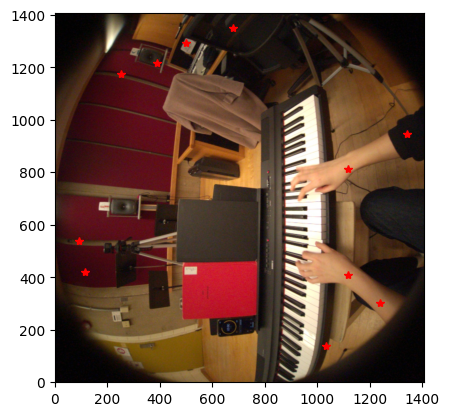

In [21]:
aria_img = cv2.imread('/mnt/shared/ego4dData/cache/iu_music/dataset/frames/aria01/214-1/214-1-00001-392.824.jpg')

plt.figure()
plt.imshow(aria_img[:,:,::-1])
plt.plot(uv[0,:], uv[1,:], 'r*')
plt.xlim(0,1408)
plt.ylim(0,1408)

#### Stitched Image from pose2d (cam02,cam03,aria01) and pose3d (cam02,cam03,ariargb) for visualization

In [4]:
########### Parameter ###########
test_case = '0630_Cooking_4'
test_dataset = 'dataset'
#################################

vis_pose2d_root = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/vis_pose2d/'
vis_pose3d_root = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/vis_pose3d/cam0203Aria_thresh=0.3_noNormConfCheck'

save_dir = f'/mnt/shared/ego4dData/cache/{test_case}/{test_dataset}/hand/stitched_vis_pose2d_pose3d'
os.makedirs(save_dir, exist_ok=True)

In [5]:
dataset_dir = [os.path.join(vis_pose2d_root,'cam02'),
                os.path.join(vis_pose2d_root,'cam03'), 
                os.path.join(vis_pose2d_root,'aria01'), 
                os.path.join(vis_pose3d_root,'cam02'), 
                os.path.join(vis_pose3d_root, 'cam03'),
                os.path.join(vis_pose3d_root, 'aria_rgb')]

num_img = len(os.listdir(dataset_dir[0]))

In [ ]:
H, W = 2160, 3840
num_row, num_col = 2, 3
total_height, total_width = num_row*H, num_col*W

# Iterate through all images
for idx in tqdm(range(num_img)):
    canvas = 255 * np.ones((total_height, total_width, 3))
    for img_idx in range(6):
        curr_img_dir = glob.glob(os.path.join(dataset_dir[img_idx],'*'))[idx]
        camera_image = cv2.imread(curr_img_dir)
        # Pad aria images from 1408x1408 onto 2160x3840
        if img_idx == 2:
            padded_img = np.ones((H,W,3))
            padded_img[:,840:3000,:] = cv2.resize(camera_image, (2160,2160))
        elif img_idx == 5:
            padded_img = np.ones((H,W,3))
            padded_img[:,840:3000,:] = cv2.rotate(cv2.resize(camera_image, (2160,2160)), cv2.ROTATE_90_CLOCKWISE)
        else:
            padded_img = camera_image

        # Append current image into canvas
        col_idx = img_idx % 3
        row_idx = img_idx // 3
        origin_x = W * col_idx
        origin_y = H * row_idx
        canvas[origin_y:origin_y+H, origin_x:origin_x+W, :] = padded_img

    # Save result
    canvas = cv2.resize(canvas, (5760,2160))
    cv2.imwrite(os.path.join(save_dir, f'{idx:06d}.jpg'), canvas)